In [20]:
import time
import numpy as np
import os
import path
import pydot
import shutil
import pathlib
from PIL import Image
import PIL
import tensorflow as tf
from tensorflow import keras
import torch
from tensorflow.keras.preprocessing import image
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Add, Dense, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.models import Model, load_model

from tensorflow.keras.utils import model_to_dot

from tensorflow.keras.applications.imagenet_utils import preprocess_input

from IPython.display import SVG

import scipy.misc

from PIL import Image
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Lambda, Concatenate
from tensorflow.keras.initializers import glorot_uniform
import shutil
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import cv2
from matplotlib import pyplot as plt
from tqdm import tqdm
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from matplotlib import animation, rc

Loading Dataset

In [21]:

img_dir='/kaggle/input/visdrone2019/images/train' #defining the path that holds the training dataset images
txt_dir='/kaggle/input/visdrone2019/labels/train' #defining the path that holds the training dataset labels
img_dir_test='/kaggle/input/visdrone2019/images/test' #defining the path that holds the testing dataset images
txt_dir_test='/kaggle/input/visdrone2019/labels/test' #defining the path that holds the testing dataset labels
!mkdir rimages
impaths=[]   
files=os.listdir(img_dir)
#Store images of training dataset in an array impaths
for item in files:
    impaths+=[os.path.join(img_dir,item)]
impaths.sort()

#Reading images in impaths array
images0=[]
for i in tqdm(range(len(impaths)//4)):
    images0+=[cv2.imread(impaths[i])]

#Storing labels of training dataset in array txtpaths    
txtpaths=[]
texts=os.listdir(txt_dir)
for item in texts:
    txtpaths+=[os.path.join(txt_dir,item)]
txtpaths.sort()

#taking a subset of images
impaths=impaths[0:9]
txtpaths=txtpaths[0:9]

#defining array that have image path and boundary box dimensions of objects inside each image
boxdata=[]
boxfile=[]
for i in range(len(txtpaths)):
    path=txtpaths[i]
    dfi=pd.read_csv(path,header=None)
    #display(dfi)
    b=[]
    for j in range(len(dfi)):
       b+=[dfi.iloc[j,0].split(' ')] 
    boxdata+=[b] 
    boxfile+=[path[0:-4].split('/')[-1]]


mkdir: cannot create directory 'rimages': File exists


100%|██████████| 1617/1617 [00:27<00:00, 58.86it/s]


# Mapping Classes of objects to Numbers from o to 9

In [22]:

#Mapping 10 classes that can be detected to numbers
class_mapping = {
  0: "pedes",
  1: "people",
  2: "bicycle",
  3: "car",
  4: "van",
  5: "truck",
  6: "tricycle",
  7: "awntric",
  8: "bus",
  9: "motor"
}



# Drawing Boundary Boxes around objects

In [23]:
def draw_box(num0):
    impath=impaths[num0] 
    image=cv2.imread(impath) 
    classes_per_image = {}
    H,W=image.shape[0],image.shape[1] #getting the dimensions H,W of training images
    file=impath[0:-4].split('/')[-1] 
    #print(H,W)
    data=[]
    box=boxdata[num0]

    for i in range(len(box)):#len(box) #looping over boundry box information array
        x=float(box[i][1])   #x, y are center of boundry box
        y=float(box[i][2])    
        w=float(box[i][3])  #w,h are height and weight of boundry box
        h=float(box[i][4])
        x0=int((x-w/2)*W)   #xo,yo are the left most point of boundry box
        y0=int((y-h/2)*H) 
        x1=int((x+w/2)*W)  #x1,y1 are the right most point of boundry box
        y1=int((y+h/2)*H)
        cv2.rectangle(image,(x0,y0),(x1,y1),(0,255,0),2)   #drawing the rectangle , The color of the rectangle is set to green (0, 255, 0) with a thickness of 2 pixels.                    
        class_number = int(box[i][0])  # Get the class number
        class_name = class_mapping.get(class_number, "Unknown")  # Get the class name from the mapping
        classes_per_image.setdefault(file, set()).add(class_name)

    # Convert the set of classes to a list if needed
    data = [{'Image_Path': image_path, 'Labels': list(labels)} for image_path, labels in classes_per_image.items()]
    cv2.imwrite('/kaggle/working/rimages/'+file+'.png',image)  #Saves the modified image with bounding boxes drawn on it to a specified directory 
    return image

## Dataset PreProcessing

In [24]:
def square_crop_image(im: Image.Image) -> Image.Image:
    width, height = im.size
    new_size = min(width, height)

    # center crop
    left = (width - new_size) / 2 
    top = (height - new_size) / 2
    right = (width + new_size) / 2
    bottom = (height + new_size) / 2
    #convert image to a cropped version so that all images have the same dimensions
    crop_im = im.crop((left, top, right, bottom))
    crop_im = crop_im.convert('RGB')

    return crop_im

In [25]:

def make_dataset(in_folder, im_per_class):
    # Iterate through all folders (there should be one folder per object class)
        # Create the output folder for processed images for the current class
        out ="/kaggle/working/processed_images" 
        if os.path.exists(out): #if it exists already, delete it
            shutil.rmtree(out)
        os.makedirs(out)
        fld_path = pathlib.Path(os.path.join('/','kaggle', 'input', 'visdrone2019','images','train'))  #hold path of training images
        num_images = 0
#crop images into square with same dimensions using square_crop_image function
        for file in list(fld_path.glob('*')):
            try:
                # Open image, center crop to a square
                # Save to the output folder
                with Image.open(file) as im:
                    crop_im = square_crop_image(im)
                    crop_im.save(os.path.join(out, f"{num_images}.jpg")) #save it in out with itsname.jpg format
                    plt.figure(figsize=(15, 15))
                    plt.imshow(crop_im)
                    im.close()
                # Break when the desired number of images has been processed (to keep classes balanced)
                num_images += 1
                if num_images >= im_per_class:
                    break
            except Exception as e:
                print(f"Error processing image '{file}': {e}")
                continue

In [26]:

# path to input and output folders
in_folder = "/kaggle/input/visdrone2019/images/train"
out_folder = "/kaggle/working/processed_images_classified"
# path to input and output folders
in_folder_test = "/kaggle/input/visdrone2019/images/test"
out_folder_test= "/kaggle/working/processed_images_classified_test"

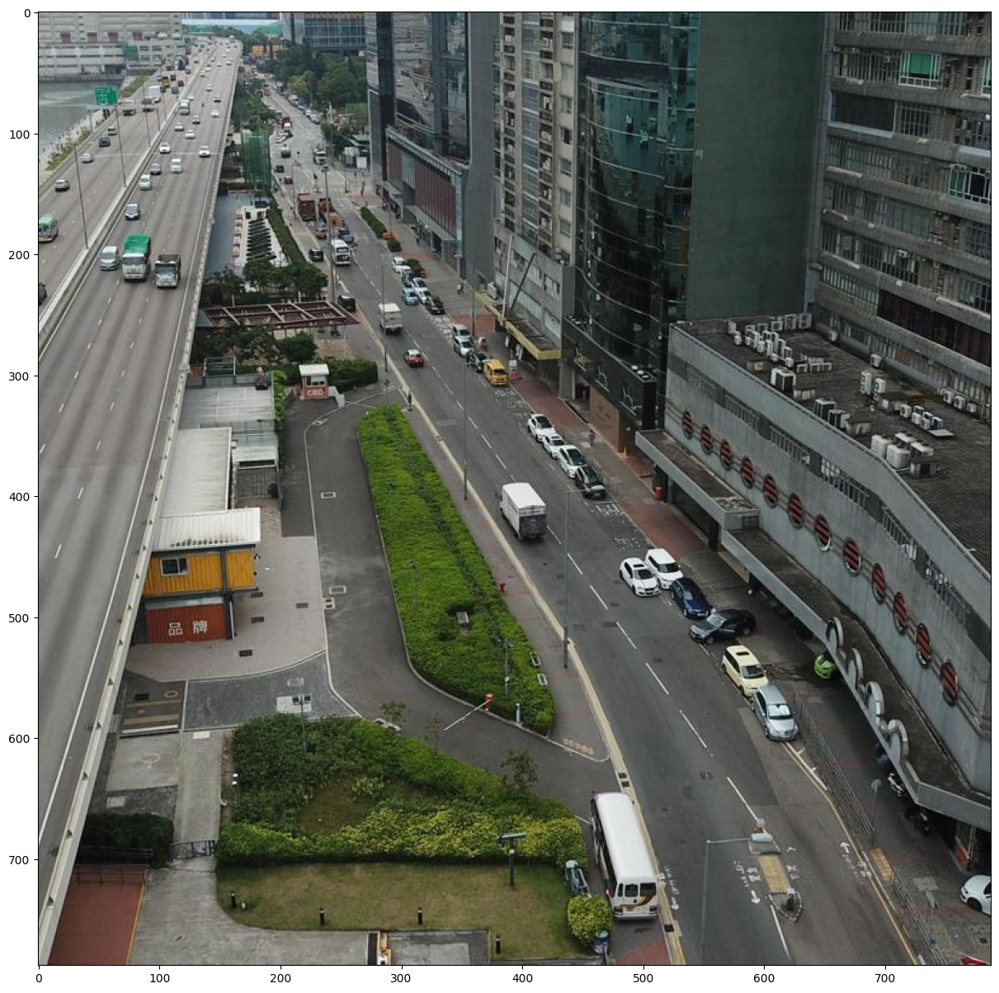

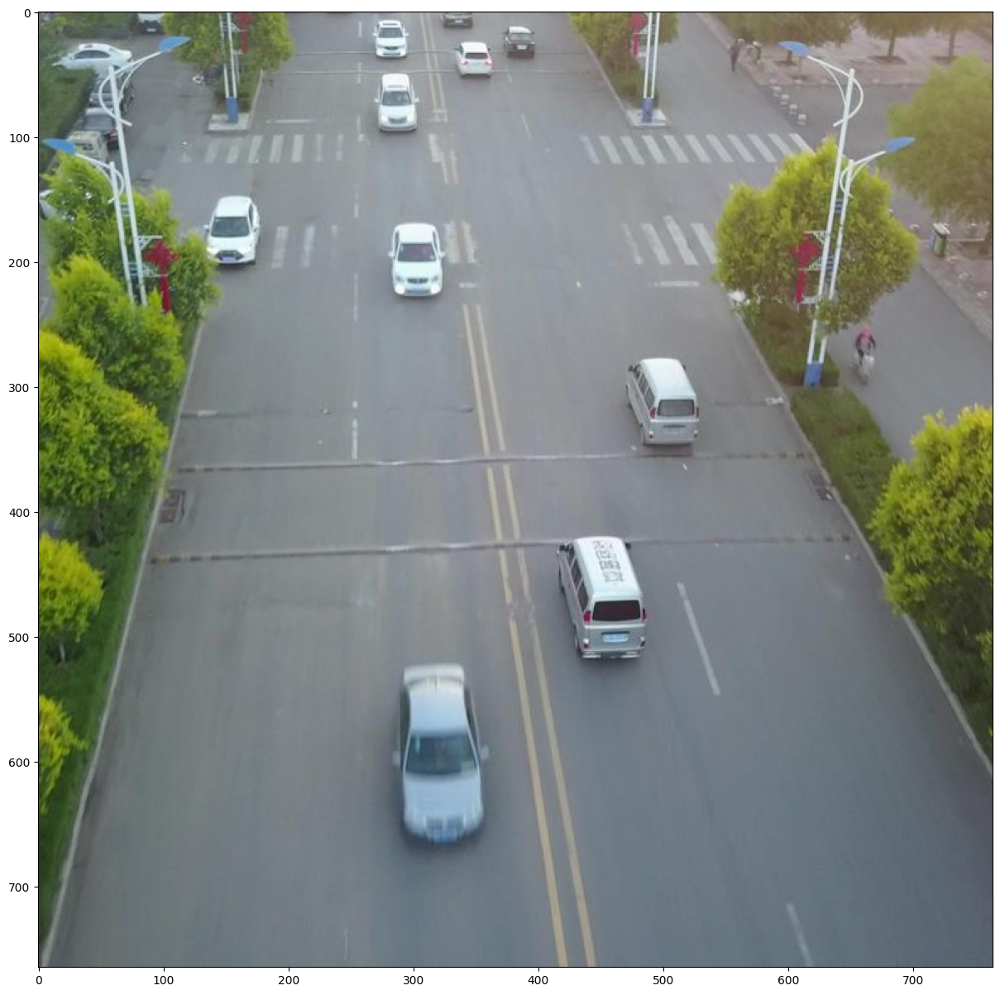

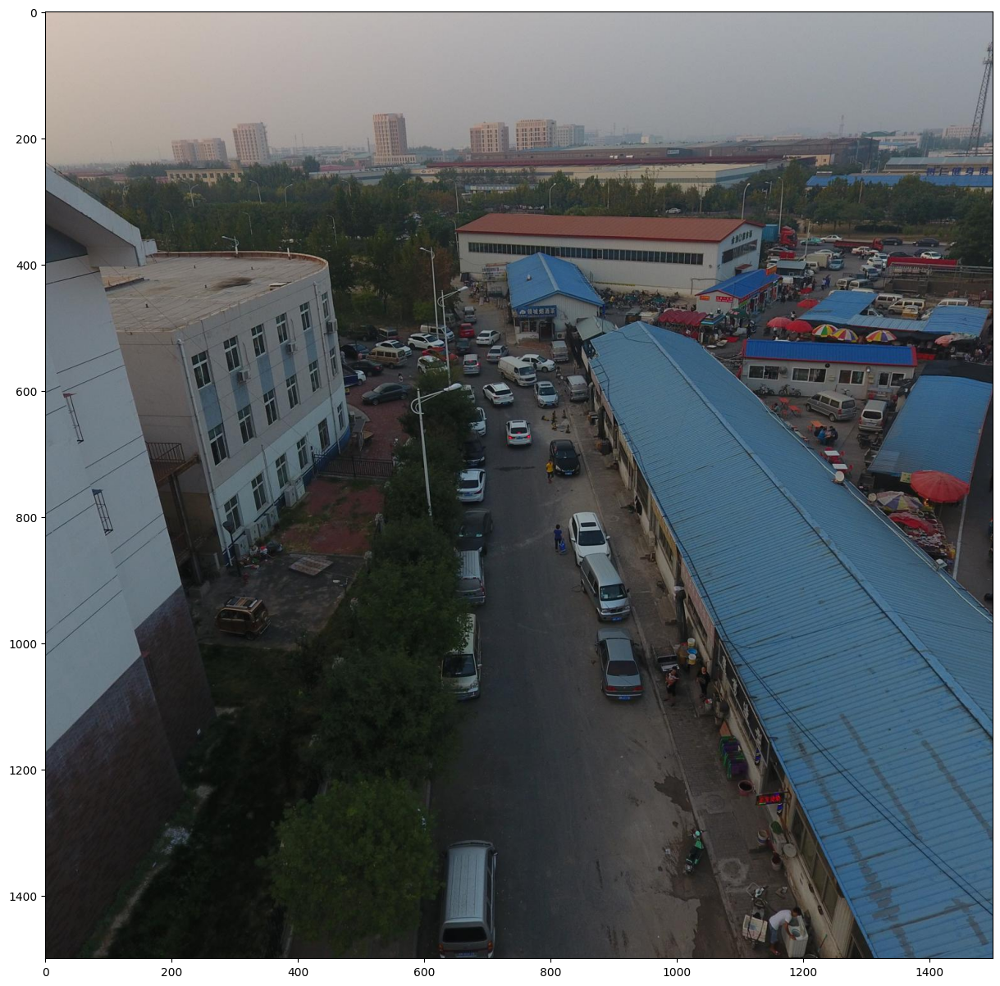

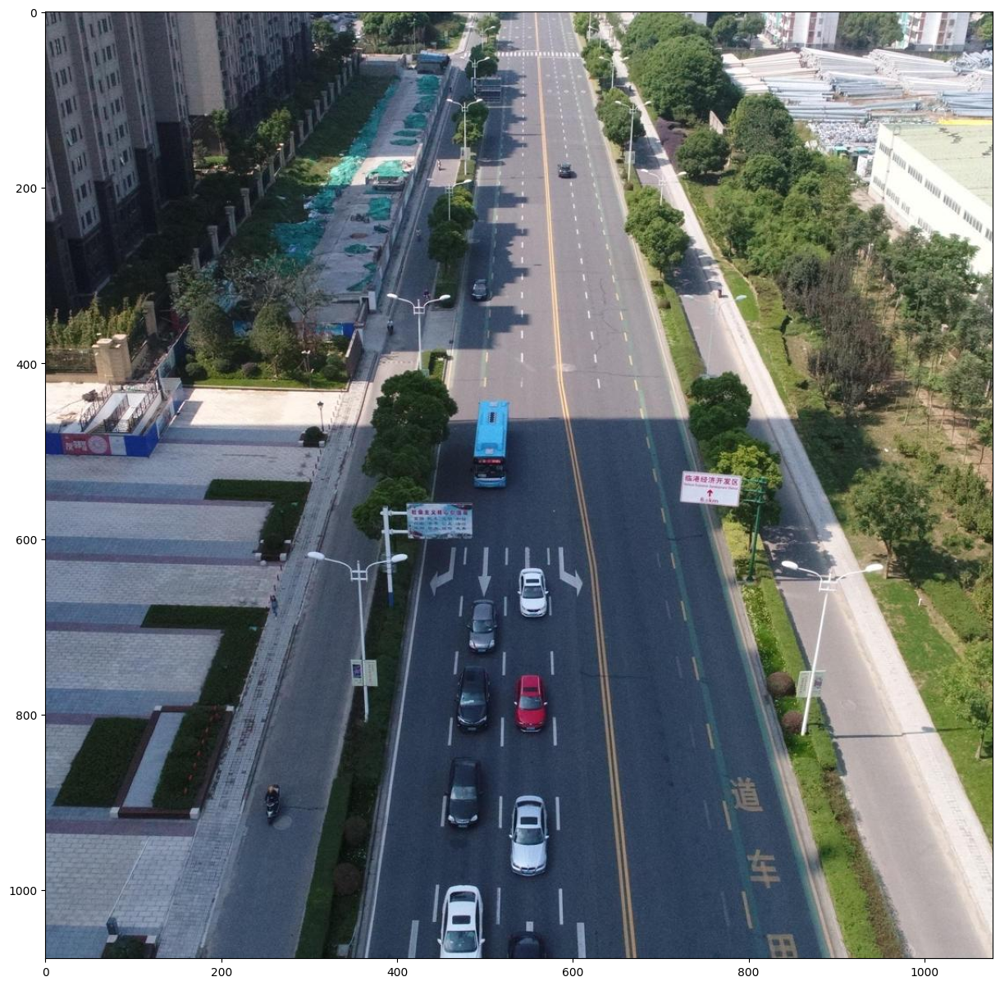

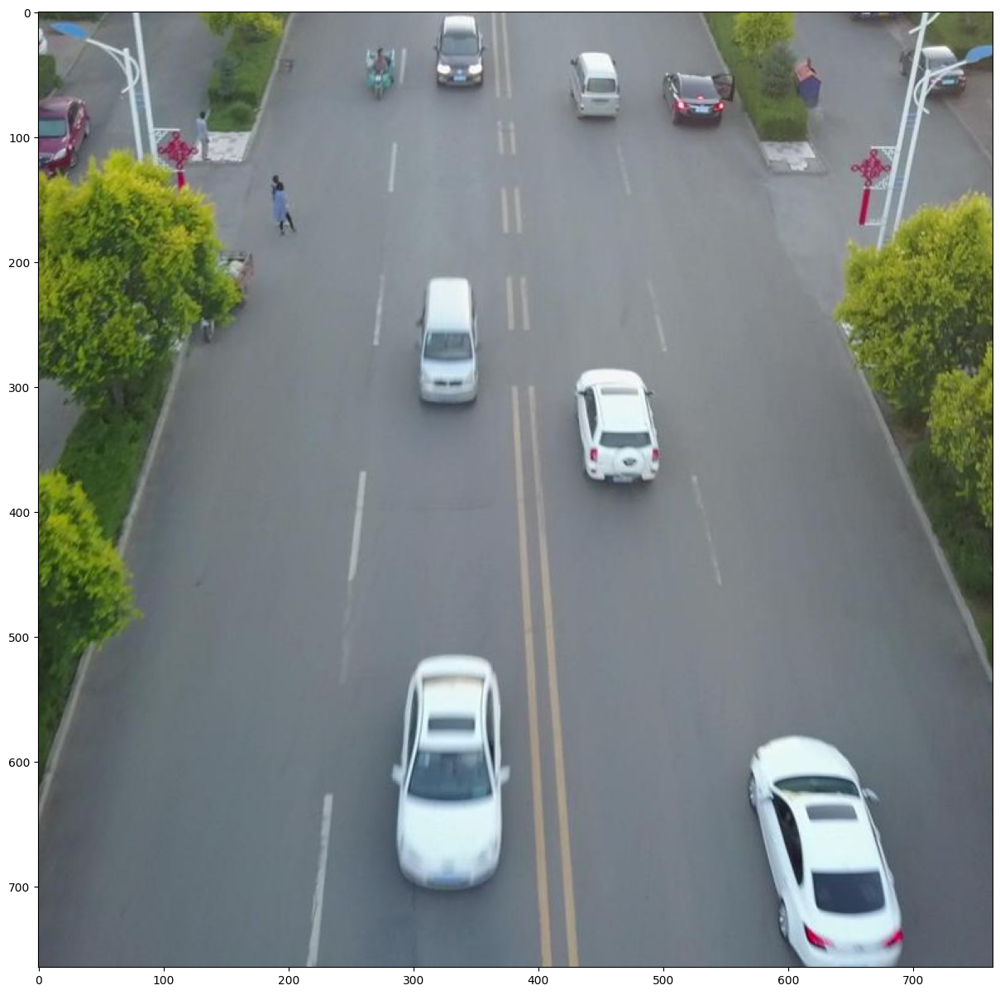

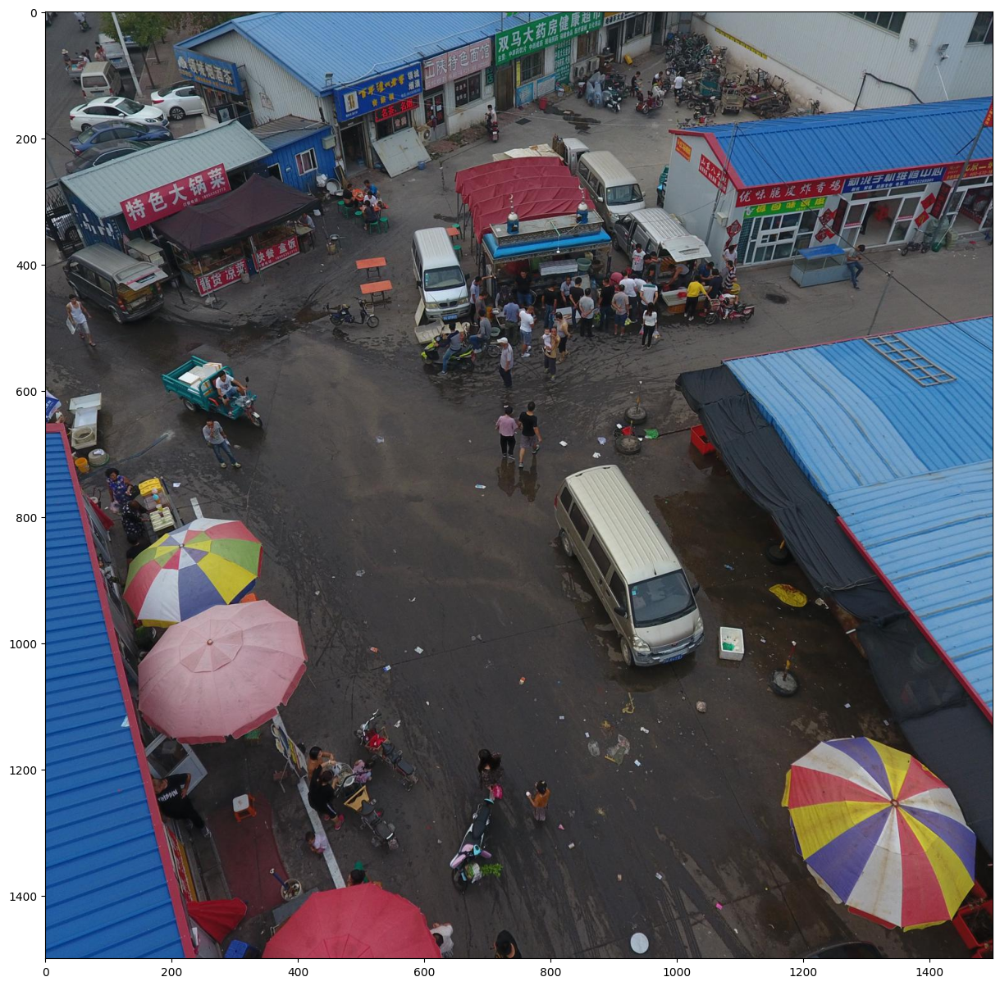

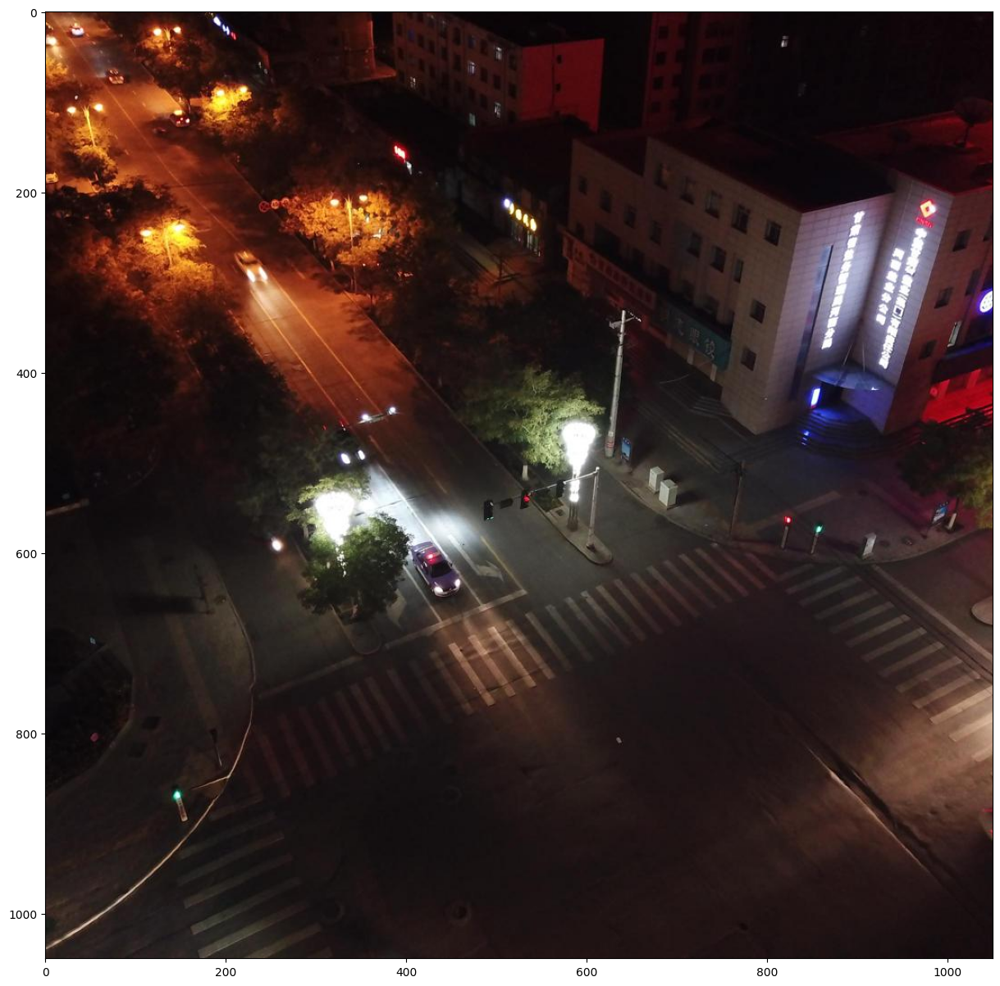

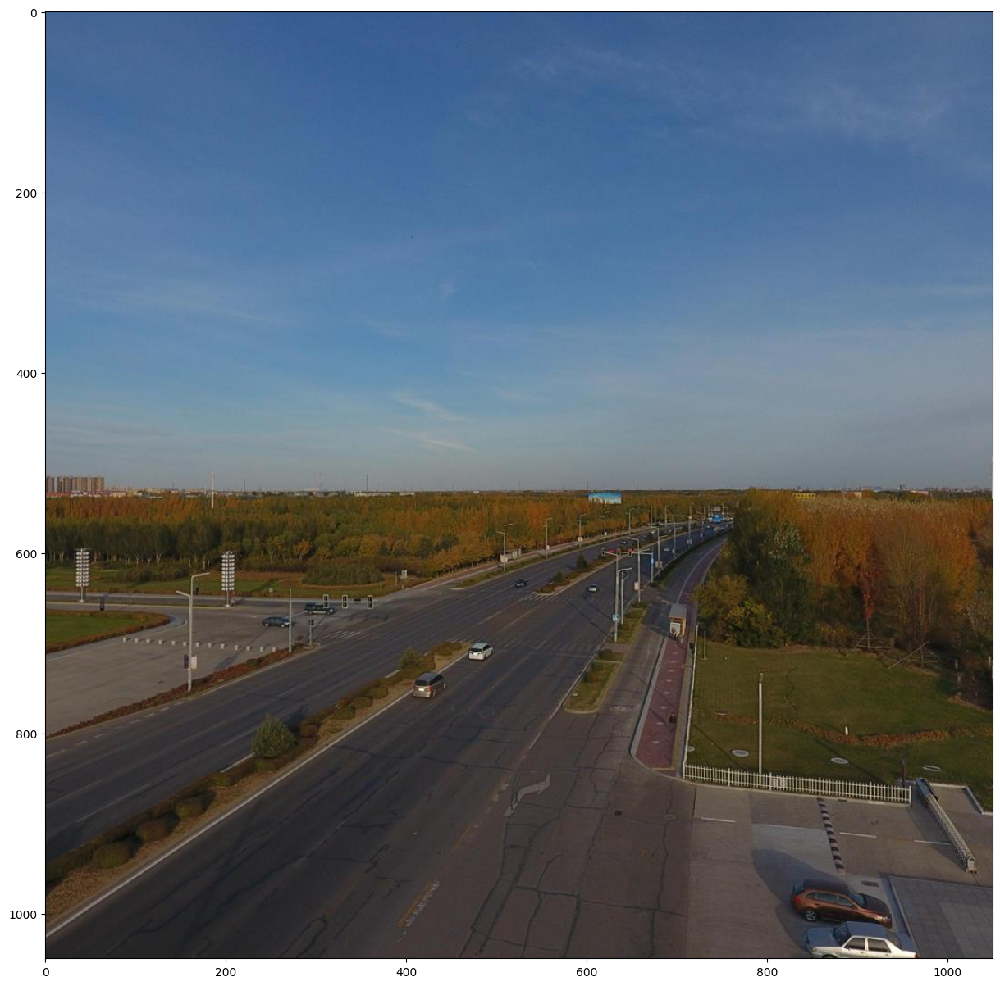

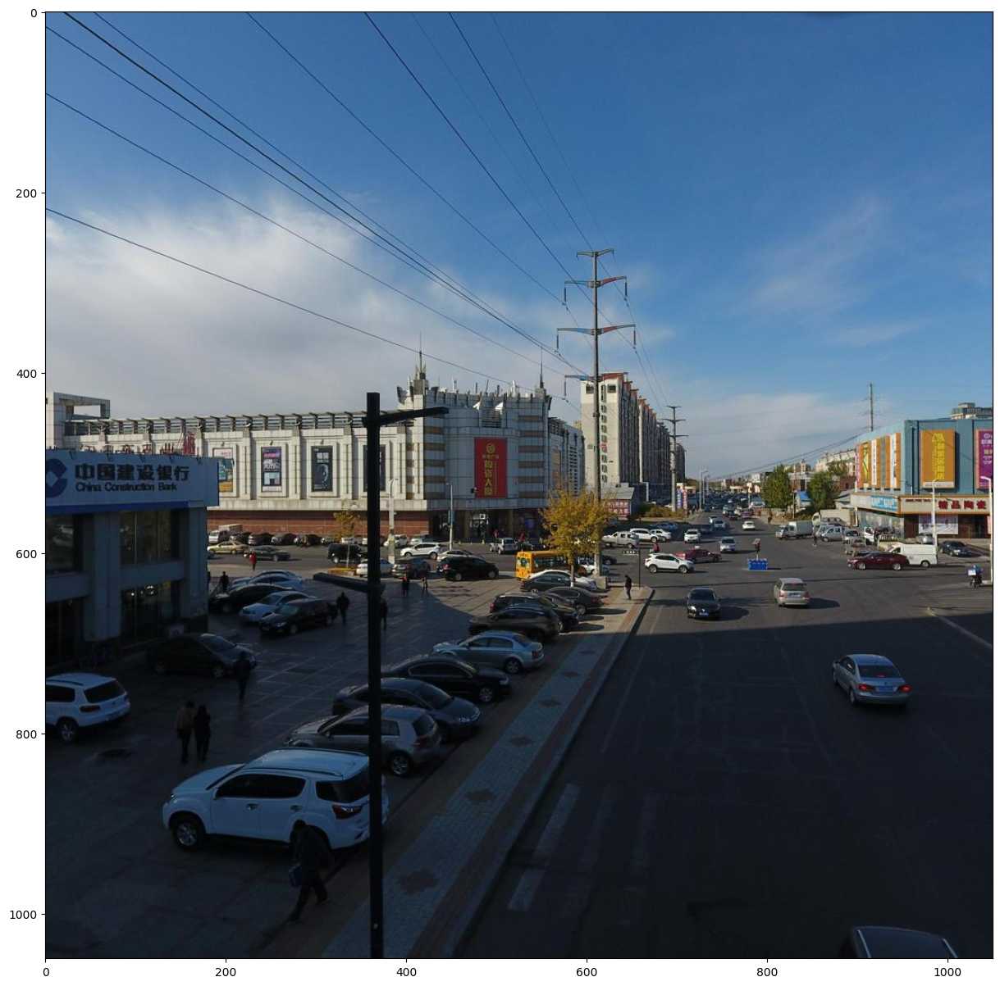

In [27]:
#Printing images after being cropped to a new size to be matched
im_per_class = 9
# process input images and organize into folders based on classes
make_dataset(in_folder,  im_per_class)

In [28]:
def preprocess_image(im_per_class2):
    #Convert cropped images to 640x640 dimensions
    out2 = "/kaggle/working/resizedImages"
    out3 = "/kaggle/working/resizedImagesInArray"
    if os.path.exists(out2):  # if it exists already, delete it
        shutil.rmtree(out2)
    if os.path.exists(out3):  # if it exists already, delete it
        shutil.rmtree(out3)
    os.makedirs(out2, exist_ok=True)  # Create the output directory if it doesn't exist
    os.makedirs(out3, exist_ok=True)  # Create the output directory if it doesn't exist

    fld_path = pathlib.Path(os.path.join('/','kaggle', 'output', '/kaggle/working', 'processed_images'))
    num_images = 0
    for file in list(fld_path.glob('*')):
        with Image.open(file) as im:
            # Convert the PIL Image to a NumPy array
            im_np = np.array(im)
            resized_image = cv2.resize(im_np, (size[0], size[1]))
            resized_image_saved = im.resize((size[0], size[1]))
            resized_image_saved.save(os.path.join(out2, f"{num_images}.jpg")) #save it in out with itsname.jpg format
            # Convert the image to float32
            processed_image = resized_image.astype(np.float32)
            # Normalize the image
            processed_image /= 255.0
            # Add batch dimension
            processed_image = np.expand_dims(processed_image, axis=0)
            print("Resized image dimensions:", processed_image.shape[1:])  # Print dimensions of resized image
            # Save the processed image
            #cv2.imwrite(os.path.join(out3, f"{num_images}.jpg"), processed_image)
            # Save the processed image
            cv2.imwrite(os.path.join(out3, f"{num_images}.jpg"), processed_image[0])
            plt.imshow(processed_image[0])  # Since 'processed_im' has a batch dimension, we access the first image with [0]
            plt.axis('on')  # Turn off axis
            plt.show()
            num_images += 1
            if num_images >= im_per_class2:
                break

    return

In [29]:
#Defining parameters of input image of dimensions 640x640x3
size=(640,640)
channels=3

Resized image dimensions: (640, 640, 3)


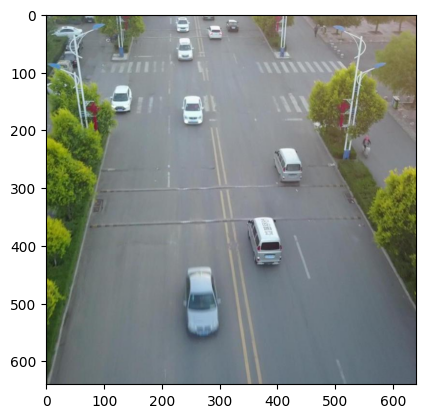

Resized image dimensions: (640, 640, 3)


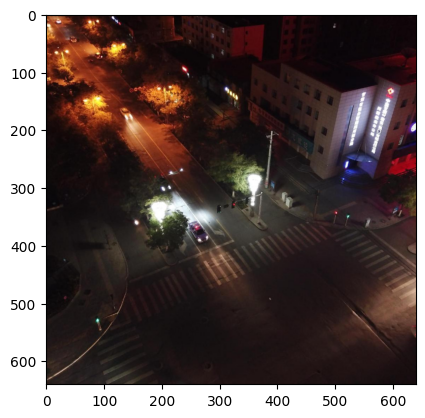

Resized image dimensions: (640, 640, 3)


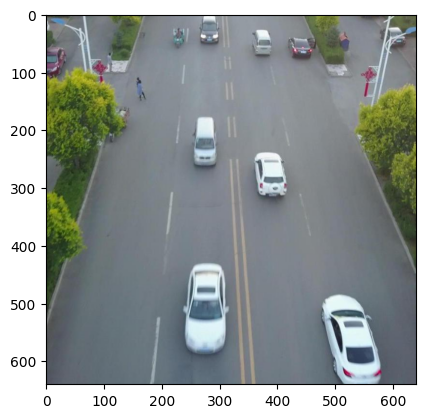

Resized image dimensions: (640, 640, 3)


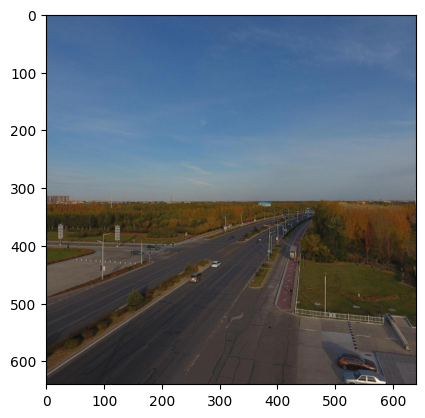

Resized image dimensions: (640, 640, 3)


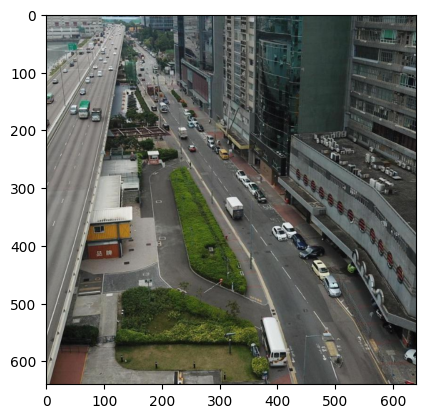

Resized image dimensions: (640, 640, 3)


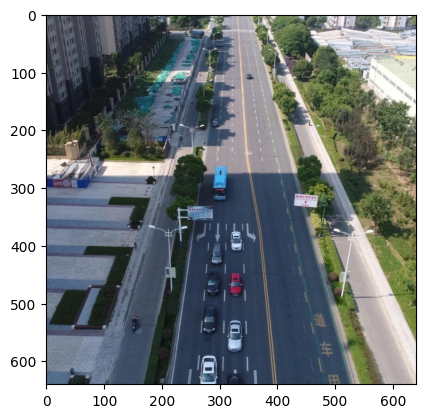

Resized image dimensions: (640, 640, 3)


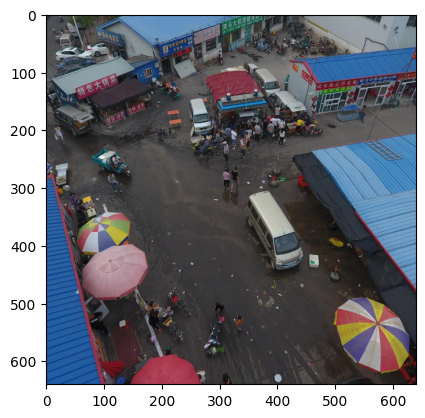

Resized image dimensions: (640, 640, 3)


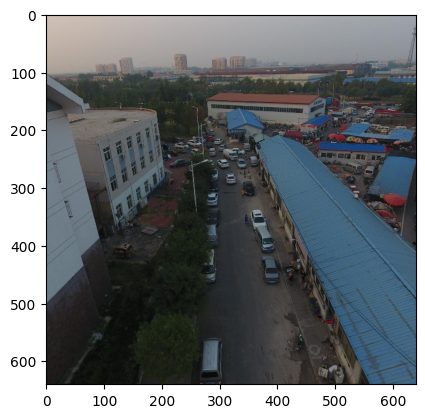

Resized image dimensions: (640, 640, 3)


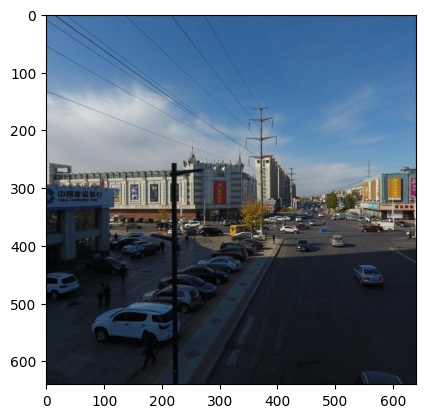

In [30]:
#Printing part of dataset after being processed
im_per_class2=10
preprocess_image(im_per_class2)

# Writing .CSV file

In [31]:
resized_img_dir='/kaggle/working/resizedImages' #Defining a path to save the resized images
impaths_test=[]
files=os.listdir(resized_img_dir)
#Loading resized images to an array impaths_test
for item in files:
    impaths_test+=[os.path.join(resized_img_dir,item)]
impaths_test.sort()

In [32]:
def draw_box2(impaths):
    data = []
    #Mapping the objects to numbers 0f their classes in each image
    for i in range(len(impaths)):
        impath = impaths[i]
        print("Processing image:", impath)  # Print the image path to check if it's correctly processed
        image = cv2.imread(impath)
        H, W = image.shape[0], image.shape[1]  # Getting the dimensions H, W of training images
        file = impath[0:-4].split('/')[-1]
        box = boxdata[i]

        classes_per_image = {}
        for j in range(len(box)):
            x = float(box[j][1])  # x, y are center of boundary box
            y = float(box[j][2])
            w = float(box[j][3])  # w, h are height and weight of boundary box
            h = float(box[j][4])
            x0 = int((x - w / 2) * W)  # x0, y0 are the leftmost point of boundary box
            y0 = int((y - h / 2) * H)
            x1 = int((x + w / 2) * W)  # x1, y1 are the rightmost point of boundary box
            y1 = int((y + h / 2) * H)
            cv2.rectangle(image, (x0, y0), (x1, y1), (0, 255, 0), 2)  # Drawing the rectangle
            class_number = int(box[j][0])  # Get the class number
            class_name = class_mapping.get(class_number, "Unknown")  # Get the class name from the mapping
            cv2.putText(image, class_name, (x0, y0 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)  # Put text with class name
            classes_per_image.setdefault(file, set()).add(class_name)
        
        # Print the classes detected in the current image
        print("Classes in", impath, ":", classes_per_image[file])
        
        # Convert the set of classes to a list if needed
        data.extend([{'Image_Path': impath, 'Labels': list(labels)} for impath, labels in classes_per_image.items()])
       # print(data)
    return data

In [33]:

import csv
#writing .csv file that contains path for each image in imapths_test (that holds resized images) and labels of objects inside it
def write_to_csv(data, file_name):
    # Specify the field names (column names) for your CSV
    fieldnames = ['Image_Path', 'Labels']

    # Open the CSV file in 'write' mode
    with open(file_name, mode='w', newline='') as file:
        # Create a CSV writer object
        writer = csv.DictWriter(file, fieldnames=fieldnames)
        # Write the header (field names)
        writer.writeheader()
        # Write data rows
        for row in data:
            labels = ', '.join(row['Labels'])  # Join multiple labels with a comma
            writer.writerow({'Image_Path': row['Image_Path'], 'Labels': labels})
data = draw_box2(impaths_test)  # Pass a list containing the image index
#print(data)
write_to_csv(data, '/kaggle/working/output.csv')
print(data)


Processing image: /kaggle/working/resizedImages/0.jpg
Classes in /kaggle/working/resizedImages/0.jpg : {'pedes', 'van', 'awntric', 'people', 'tricycle', 'bicycle', 'truck', 'motor', 'car'}
Processing image: /kaggle/working/resizedImages/1.jpg
Classes in /kaggle/working/resizedImages/1.jpg : {'pedes', 'van', 'awntric', 'tricycle', 'people', 'bicycle', 'motor', 'car'}
Processing image: /kaggle/working/resizedImages/2.jpg
Classes in /kaggle/working/resizedImages/2.jpg : {'pedes', 'van', 'people', 'tricycle', 'motor', 'car'}
Processing image: /kaggle/working/resizedImages/3.jpg
Classes in /kaggle/working/resizedImages/3.jpg : {'van', 'truck', 'car'}
Processing image: /kaggle/working/resizedImages/4.jpg
Classes in /kaggle/working/resizedImages/4.jpg : {'van', 'truck', 'car'}
Processing image: /kaggle/working/resizedImages/5.jpg
Classes in /kaggle/working/resizedImages/5.jpg : {'van', 'truck', 'car'}
Processing image: /kaggle/working/resizedImages/6.jpg
Classes in /kaggle/working/resizedImag

In [34]:
def to_string_literal(label):
    """
    Convert label to a string literal.
    
    Args:
    - label: The label to convert.
    
    Returns:
    - The label as a string literal.
    """
    return "'" + str(label) + "'"


Making one hot encoder vector for each image defining objects included

In [35]:
import pandas as pd
import numpy as np

# Assuming class_mapping is defined as mentioned in the previous example

# Read the CSV file
file_path = '/kaggle/working/output.csv'  # Replace with your CSV file path
df = pd.read_csv(file_path)
class_mapping = {
  0: 'pedes',
  1: 'people',
  2: 'bicycle',
  3: 'car',
  4: 'van',
  5: 'truck',
  6: 'tricycle',
  7: 'awntric',
  8: 'bus',
  9: 'motor'
}

# Check the shape of the DataFrame
print("DataFrame Shape:", df.shape)

# Verify class_mapping dictionary
print("Class Mapping:", class_mapping)

# Initialize an empty list to store the one-hot encoded labels
one_hot_encoded_labels = []

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    print("Processing row:", index)
    # Split the labels string into individual labels
    labels = row['Labels'].split(', ')  # Uncomment this line to split the labels
    # Initialize a zero vector for one-hot encoding
    one_hot_vector = np.zeros(len(class_mapping), dtype=int)
    # Set the corresponding indices to 1 for each label
    for label in labels:
        for i in range(len(class_mapping)):
            if label==class_mapping[i]:
                
                one_hot_vector[i] = 1
    # Append the one-hot vector to the list
    one_hot_encoded_labels.append(one_hot_vector)


# Convert the list of one-hot vectors to a DataFrame
one_hot_encoded_df = pd.DataFrame(one_hot_encoded_labels, columns=class_mapping.keys())

# Concatenate the Image_Path column with the one-hot encoded labels
final_df = pd.concat([df['Image_Path'], one_hot_encoded_df], axis=1)

# Save the final DataFrame to a new CSV file
final_df.to_csv('/kaggle/working/one_hot_encoded_output.csv', index=False)


DataFrame Shape: (9, 2)
Class Mapping: {0: 'pedes', 1: 'people', 2: 'bicycle', 3: 'car', 4: 'van', 5: 'truck', 6: 'tricycle', 7: 'awntric', 8: 'bus', 9: 'motor'}
Processing row: 0
Processing row: 1
Processing row: 2
Processing row: 3
Processing row: 4
Processing row: 5
Processing row: 6
Processing row: 7
Processing row: 8


In [36]:
import pandas as pd
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Step 1: Prepare the Data
file_path = '/kaggle/working/one_hot_encoded_output.csv'
df = pd.read_csv(file_path)
img_height = 640
img_width = 640

# Convert image paths to strings
image_paths = df.iloc[:, 0].astype(str).tolist()

store_list = []
for i in tqdm(range(len(image_paths))):
    # Ensure the path is constructed properly
    path = '/kaggle/working/resizedImages/' + str(image_paths[i]) + '.jpg'
    image_check = load_img(path, target_size=(img_height, img_width))
    img_array = img_to_array(image_check)
    img_array = img_array / 255.0 #normalize images  
    store_list.append(img_array)
#convert list of loaded,resized and normalized images to numpy array to be entered to model
x = np.array(store_list)
#Extracts the label data from the DataFrame, starting from the second column onwards, and converts it to a list of lists y.
y = df.iloc[:, 1:].values.tolist()

100%|██████████| 9/9 [00:00<00:00, 227.79it/s]


# Building Model

In [37]:
def ELAN(temp: tf.Tensor, f1) -> tf.Tensor:
    # Branch 1
    f=temp.shape[-1]
    temp_branch1 = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp_branch1 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1)
    temp_branch1 =Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1)
    # Duplicate temp_branch1
    temp_branch1_duplicate = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                                    kernel_initializer=glorot_uniform(seed=0))(temp)
    temp_branch1_duplicate = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1_duplicate)
    temp_branch1_duplicate = Activation('relu')(temp_branch1_duplicate)
    # Branch 2
    
    temp_branch2 = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch1)
    temp_branch2 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch2)
    temp_branch2 = Activation('relu')(temp_branch2)
    
    temp_branch2 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch2)
    temp_branch2 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch2)
    temp_branch2= Activation('relu')(temp_branch2)
    # Branch 3
    temp_branch3 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch2)
    temp_branch3 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch3)
    temp_branch3 = Activation('relu')(temp_branch3)
    
    temp_branch3 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch3)
    temp_branch3 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch3)
    temp_branch3 = Activation('relu')(temp_branch3)
    # Concatenate branches
    temp = keras.layers.Concatenate()([temp_branch1_duplicate, temp_branch1, temp_branch2, temp_branch3])
    #print("output shape out of conc:", K.int_shape(temp))
    # Final convolutional layer
    temp =  Conv2D(filters=f1, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return temp

In [38]:
def MP(temp: tf.Tensor,f) -> tf.Tensor:
    temp = MaxPooling2D((2, 2), strides=(2, 2))(temp)
    stride=(1,1)
    temp = Conv2D(filters=f, kernel_size=(1, 1), strides=stride, padding='valid',
               kernel_initializer=glorot_uniform(seed=0))(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return temp

In [39]:

def DpMaxPool(temp: tf.Tensor,f)->tf.Tensor:
    temp = keras.layers.MaxPooling2D(pool_size=(3, 3),strides=(1, 1), padding="same")(temp)
    # print("output shape of first MP of DpMaxPool:", temp.shape)
    temp = keras.layers.DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return temp

In [40]:
def DpSPPF(temp: tf.Tensor,f) -> tf.Tensor:
    f1=temp.shape[-1] 
    stride=(1,1)
    temp= Conv2D(filters=f1, kernel_size=(1, 1), strides=(1, 1),
              padding='valid', 
              kernel_initializer=glorot_uniform(seed=0))(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    #branch
    temp1=DpMaxPool(temp,f1)
    temp1=DpMaxPool(temp1,f1)
    temp = keras.layers.Concatenate()([temp1, temp])
    temp= Conv2D(filters=f, kernel_size=(1, 1), strides=stride, padding='valid',
               kernel_initializer=glorot_uniform(seed=0))(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return(temp)

In [41]:
def ELAN_W(temp: tf.Tensor, f1) -> tf.Tensor:
    # Branch 1
    f=temp.shape[-1]
    temp_branch1 = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp_branch1 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1)
    temp_branch1 = Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1)
    
    # Duplicate temp_branch1
    temp_branch1_duplicate = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                                    kernel_initializer=glorot_uniform(seed=0))(temp)
    temp_branch1_duplicate = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch1_duplicate)
    temp_branch1_duplicate =Activation('relu')(temp_branch1_duplicate)
    # Branch 2
    
    
    temp_branch2 = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch1)
    temp_branch2 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch2)
    temp_branch2 = Activation('relu')(temp_branch2)
    
    temp_branch3 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch2)
    temp_branch3 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch2)
    temp_branch3= Activation('relu')(temp_branch3)
    # Branch 3
    temp_branch4 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch3)
    temp_branch4 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch4)
    temp_branch4 = Activation('relu')(temp_branch4)
    
    temp_branch5 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp_branch4)
    temp_branch5 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp_branch5)
    temp_branch5 = Activation('relu')(temp_branch5)
    # Concatenate branches
    temp = keras.layers.Concatenate()([temp_branch1_duplicate, temp_branch1, temp_branch2, temp_branch3,temp_branch4,temp_branch5])
  #  print("output shape out of conc:", K.int_shape(temp))
    # Final convolutional layer
    temp =  Conv2D(filters=f1, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return temp

In [42]:
def Upsample(temp: tf.Tensor,f)->tf.Tensor:
    upsample_layer = keras.layers.UpSampling2D(size=(2, 2))  
    upsampled_tensor = upsample_layer(temp)
    temp = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(upsampled_tensor)
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    temp = Activation('relu')(temp)
    return temp

In [43]:

def REP(temp: tf.Tensor,f)->tf.Tensor:
    #This structure is useful for combining features extracted at different receptive fields (3x3 and 1x1 convolutions), potentially capturing both local and more global features in the input tensor. The concatenation step merges these features, and the final ReLU activation adds non-linearity to the combined features.
    temp1 = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp1 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp1)
    temp1 =Activation('relu')(temp1)
    temp2 = Conv2D(filters=f, kernel_size=(1, 1), strides=(1, 1), padding='valid',
                          kernel_initializer=glorot_uniform(seed=0))(temp)
    temp2 = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp2)
    temp2 = Activation('relu')(temp2)
    temp = keras.layers.Concatenate()([temp1, temp2])
    temp = Activation('relu')(temp)
    return temp

In [44]:
#Both layers aim to enrich the input data with additional learnable parameters, potentially improving the model's performance by embedding implicit knowledge directly into the network's layers. These layers can be integrated into a neural network model like any other Keras layer.
# Define the Additive Implicit Knowledge layer, Adds a trainable weight to the input tensor, thus allowing the model to learn some implicit additive knowledge.

class ImplicitA(tf.keras.layers.Layer):
    def __init__(self, channel, mean=0.0, std=0.02):
        super(ImplicitA, self).__init__()
        self.channel = channel
        self.mean = mean
        self.std = std
        self.implicit = self.add_weight(shape=(1, 1, 1, channel),
                                         initializer=tf.random_normal_initializer(mean=self.mean, stddev=self.std),
                                         trainable=True)

    def call(self, x):
        return self.implicit + x

# Define the Multiplicative Implicit Knowledge layer, Multiplies a trainable weight with the input tensor, allowing the model to learn some implicit multiplicative knowledge.
class ImplicitM(tf.keras.layers.Layer):
    def __init__(self, channel, mean=1.0, std=0.02):
        super(ImplicitM, self).__init__()
        self.channel = channel
        self.mean = mean
        self.std = std
        self.implicit = self.add_weight(shape=(1, 1, 1, channel),
                                         initializer=tf.random_normal_initializer(mean=self.mean, stddev=self.std),
                                         trainable=True)

    def call(self, x):
        return self.implicit * x

In [45]:
def Head(temp: tf.Tensor, f) -> tf.Tensor:
    # to enrich the input features and potentially improve the performance of a neural network model by introducing implicit knowledge and standard convolutional operations.
    # Apply the ImplicitA layer to introduce an implicitly learned bias
    temp = ImplicitA(f)(temp)
    # Apply Conv2D layer with specified parameters
    temp = Conv2D(filters=f, kernel_size=(3, 3), strides=(1, 1), padding='same',
                  kernel_initializer=glorot_uniform(seed=0))(temp)
    
    # Apply local response normalization
    temp = tf.keras.layers.Lambda(lambda x: tf.nn.local_response_normalization(x))(temp)
    
    # Apply ReLU activation function
    temp = Activation('relu')(temp)
    
    # Apply another ImplicitA layer (incorrect usage, should be removed or replaced)
    temp = ImplicitM(f)(temp)  # This line is incorrect, as it creates a new instance of ImplicitA without passing input tensor
    
    return temp

In [46]:
def build_model2(size, channel):
    input_layer = Input((size[1], size[0], channel))

    # Define the layers
    conv1 = Conv2D(filters=24, kernel_size=(3, 3), strides=(1, 1), padding='same', 
                   kernel_initializer=glorot_uniform(seed=0))(input_layer)
    norm1 = Lambda(lambda x: tf.nn.local_response_normalization(x))(conv1)
    relu1 = Activation('relu')(norm1)
    pool1 = MaxPooling2D(pool_size=(2, 2), padding='valid')(relu1)

    conv2 = Conv2D(filters=24, kernel_size=(3, 3), strides=(1, 1), padding='same', 
                   kernel_initializer=glorot_uniform(seed=0))(pool1)
    norm2 = Lambda(lambda x: tf.nn.local_response_normalization(x))(conv2)
    relu2 = Activation('relu')(norm2)

    conv3 = Conv2D(filters=24, kernel_size=(3, 3), strides=(1, 1), padding='same', 
                   kernel_initializer=glorot_uniform(seed=0))(relu2)
    norm3 = Lambda(lambda x: tf.nn.local_response_normalization(x))(conv3)
    relu3 = Activation('relu')(norm3)

    # Apply ELAN and MP
    elan1 = ELAN(relu3, 128)
    mp1 = MP(elan1, 128)
    elan2 = ELAN(mp1, 256)

    # Branch 1
    temp1 = elan2
    temp1 = MP(temp1, 512)
    temp1 = ELAN(temp1, 512)
    temp1 = DpSPPF(temp1, 256)
    temp1 = ELAN_W(temp1, 128)
    temp4 = temp1
    temp1 = Upsample(temp1, 64)

    # Branch 2
    temp2 = elan2
    temp2 = Conv2D(filters=64, kernel_size=(3, 3), strides=(1, 1), padding='same', 
                   kernel_initializer=glorot_uniform(seed=0))(temp2)
    temp2 = Lambda(lambda x: tf.nn.local_response_normalization(x))(temp2)
    temp2 = Activation('relu')(temp2)

    temp3 = Concatenate()([temp1, temp2])
    temp3 = ELAN_W(temp3, 64)
    temp5 = temp3
    temp3 = MP(temp3, 128)
    temp4 = Concatenate()([temp3, temp4])
    temp4 = ELAN_W(temp4, 256)
    temp5 = REP(temp5, 64)
    temp4 = REP(temp4, 128)

    temp4 = Head(temp4, 256)
    temp5 = Head(temp5, 128)

    # Adding fully connected layers
    flat = Flatten()(temp4)  # Flattening the output of the last convolutional layer
    dense1 = Dense(512, activation='relu')(flat)  # First fully connected layer
    dense2 = Dense(256, activation='relu')(dense1)  # Second fully connected layer
    output_layer = Dense(10, activation='softmax')(dense2)  # Output layer (adjust the number of classes as needed)

    model = Model(inputs=input_layer, outputs=output_layer)
    return model

In [47]:
size=(640,640)
channel=3
model = build_model2(size, channel)
model.summary()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 640, 640,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 640, 640,  │        672 │ input_layer[0][0] │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 640, 640,  │          0 │ conv2d[0][0]      │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 640, 640,  │          0 │ lambda[0][0]      │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 320, 320,  │          0 │ activation[0][0]  │
│ (MaxPooling2D)      │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 320, 320,  │      5,208 │ max_pooling2d[0]… │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_1 (Lambda)   │ (None, 320, 320,  │          0 │ conv2d_1[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 320, 320,  │          0 │ lambda_1[0][0]    │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 320, 320,  │      5,208 │ activation_1[0][… │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_2 (Lambda)   │ (None, 320, 320,  │          0 │ conv2d_2[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 320, 320,  │          0 │ lambda_2[0][0]    │
│ (Activation)        │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 320, 320,  │        600 │ activation_2[0][… │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_3 (Lambda)   │ (None, 320, 320,  │          0 │ conv2d_3[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_4 (Lambda)   │ (None, 320, 320,  │          0 │ lambda_3[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 320, 320,  │        600 │ lambda_4[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda_6 (Lambda)   │ (None, 320, 320,  │          0 │ conv2d_5[0][0]    │
│                     │ 24)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 320, 320,  │          0 │ lambda_6[0][0]  

 Total params: 854,146,986 (3.18 GB)

 Trainable params: 854,146,986 (3.18 GB)

 Non-trainable params: 0 (0.00 B)

In [48]:
#Reading .csv file that includes the one hot encoder vector
data=pd.read_csv('/kaggle/working/one_hot_encoded_output.csv')
print(data)
import pandas as pd
# Read the CSV file
file_path = '/kaggle/working/one_hot_encoded_output.csv'
df = pd.read_csv(file_path)

# Extract the first column values into a list
first_column_list = df.iloc[:, 0].tolist()

# Exclude the first column and save the remaining rows as a list of lists
remaining_rows_list = df.iloc[:, 1:].values.tolist()



   Image_Path  0  1  2  3  4  5  6  7  8  9
0           0  1  1  1  1  1  1  1  1  0  1
1           1  1  1  1  1  1  0  1  1  0  1
2           2  1  1  0  1  1  0  1  0  0  1
3           3  0  0  0  1  1  1  0  0  0  0
4           4  0  0  0  1  1  1  0  0  0  0
5           5  0  0  0  1  1  1  0  0  0  0
6           6  0  0  0  0  0  1  0  0  0  0
7           7  0  0  0  1  1  1  1  0  0  1
8           8  0  0  0  1  0  1  0  0  0  0


In [49]:
from tensorflow.keras.preprocessing import image
store_list = []

for i in tqdm(range(data.shape[0])):
    # Convert the element to a string before concatenating
    path = '/kaggle/working/resizedImages/' + str(first_column_list[i]) + '.jpg'
    image_check = image.load_img(path, target_size=(640, 640))
    image_check = image.img_to_array(image_check)
    image_check = image_check / 255
    store_list.append(image_check)
#converting the loaded, normalized and resized images to numpy array
x = np.array(store_list)
y = data.drop(columns=['Image_Path'])
y = y.to_numpy()
print(y.shape)
print(type(y))


100%|██████████| 9/9 [00:00<00:00, 212.55it/s]

(9, 10)
<class 'numpy.ndarray'>


In [ ]:
#Training model
history = model.fit(x, y)